In [1]:
import sys
sys.path.append("../../")

from astronn.preprocess import predeltascuti, precorot
from astronn.datasets import deltascuti, starmodels, corot
from astronn import models

import tensorflow as tf
#tf.compat.v1.disable_v2_behavior() 

import pandas as pd
import numpy as np
import shap

import matplotlib.pyplot as plt
from pygam import LinearGAM, s, f
from sklearn.mixture import GaussianMixture

from collections import Counter

Using TensorFlow backend.


#### Preprocess is not needed if data exists in beforehand

In [2]:
# Preprocess eleven delta scuti stars
if False:
    # Preprocess DS stars
    preprocessor = predeltascuti()
    preprocessor.preprocess_files(
        input_folder="../../astronn/data/deltascuti/raw/*",
        output_folder="../../astronn/data/deltascuti/preprocessed/",
    )

# Preprocess 77 CoRoT stars
if False:
    preprocessor = precorot(conf_file="../../astronn/data/corot/parameters.csv", cols=["corot", "loggs", "l"])
    preprocessor.preprocess_files(
        input_folder="../../astronn/data/corot/raw/*",
        output_folder="../../astronn/data/corot/preprocessed/",
    )

In [3]:
star_models = starmodels()
df_sm = star_models.load("/home/roberto/Downloads/dataall_parts/*", batch_size=150, add_noise=True)

[[ 0.          0.00815968  0.        ]
 [ 0.21157263  0.00384438  0.        ]
 [ 0.          0.3         0.        ]
 ...
 [ 0.          0.00033675  0.09084545]
 [ 0.13223355  0.00060578 -0.0322    ]
 [ 0.05729166  0.          0.2867812 ]]


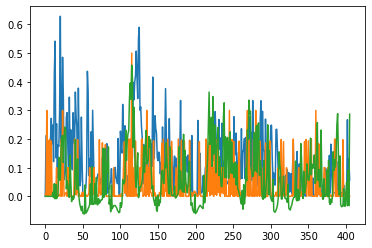

In [4]:

aux = None
for star in df_sm.take(1):  # take the 1 ds stars
    aux = star
    print(str(star[0].numpy()[0]))
x = aux[0].numpy()

plt.plot(x[0, :, 0])
plt.plot(x[0, :, 1])
plt.plot(x[0, :, 2])
plt.show()

#### Utils functions

In [5]:
def normalize(x):
    """
    """
    return (x - np.min(x)) / (np.max(x) - np.min(x))

# Custom metrics
def top_2_categorical_accuracy(y_true, y_pred):
    return tf.keras.metrics.top_k_categorical_accuracy(y_true, y_pred, k=2)

def top_4_categorical_accuracy(y_true, y_pred):
    return tf.keras.metrics.top_k_categorical_accuracy(y_true, y_pred, k=4)

def top_6_categorical_accuracy(y_true, y_pred):
    return tf.keras.metrics.top_k_categorical_accuracy(y_true, y_pred, k=6)

def top_8_categorical_accuracy(y_true, y_pred):
    return tf.keras.metrics.top_k_categorical_accuracy(y_true, y_pred, k=8)

def calculate_shap_by_gradient(model, x_explain):
    """
    """
    e = shap.GradientExplainer(model, x_train, batch_size=1000, local_smoothing=0)
    shap_values, indexes = e.shap_values(x_explain, nsamples=10000, ranked_outputs=5)
    return shap_values, indexes

In [6]:
# Load best model (old train method)
sepconv_mod = tf.keras.models.load_model(
    "/home/roberto/Projects/asteroseismologyNN/models/model_dnu_noisy.h5",
    custom_objects={"rec_at_2": top_2_categorical_accuracy,
                    "rec_at_4": top_4_categorical_accuracy,
                    "recat_6": top_6_categorical_accuracy,
                    "rec_at_8": top_8_categorical_accuracy}
)

#### Process 11 ds stars, infer Dnu and calculate shap values explanations

Model: &quot;sequential&quot;
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
separable_conv1d (SeparableC (None, 397, 10)           610       
_________________________________________________________________
batch_normalization (BatchNo (None, 397, 10)           40        
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 198, 10)           0         
_________________________________________________________________
separable_conv1d_1 (Separabl (None, 194, 10)           1510      
_________________________________________________________________
batch_normalization_1 (Batch (None, 194, 10)           40        
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 97, 10)            0         
_________________________________________________________________
separable_conv1d_2 (Separabl (None, 93, 10)   

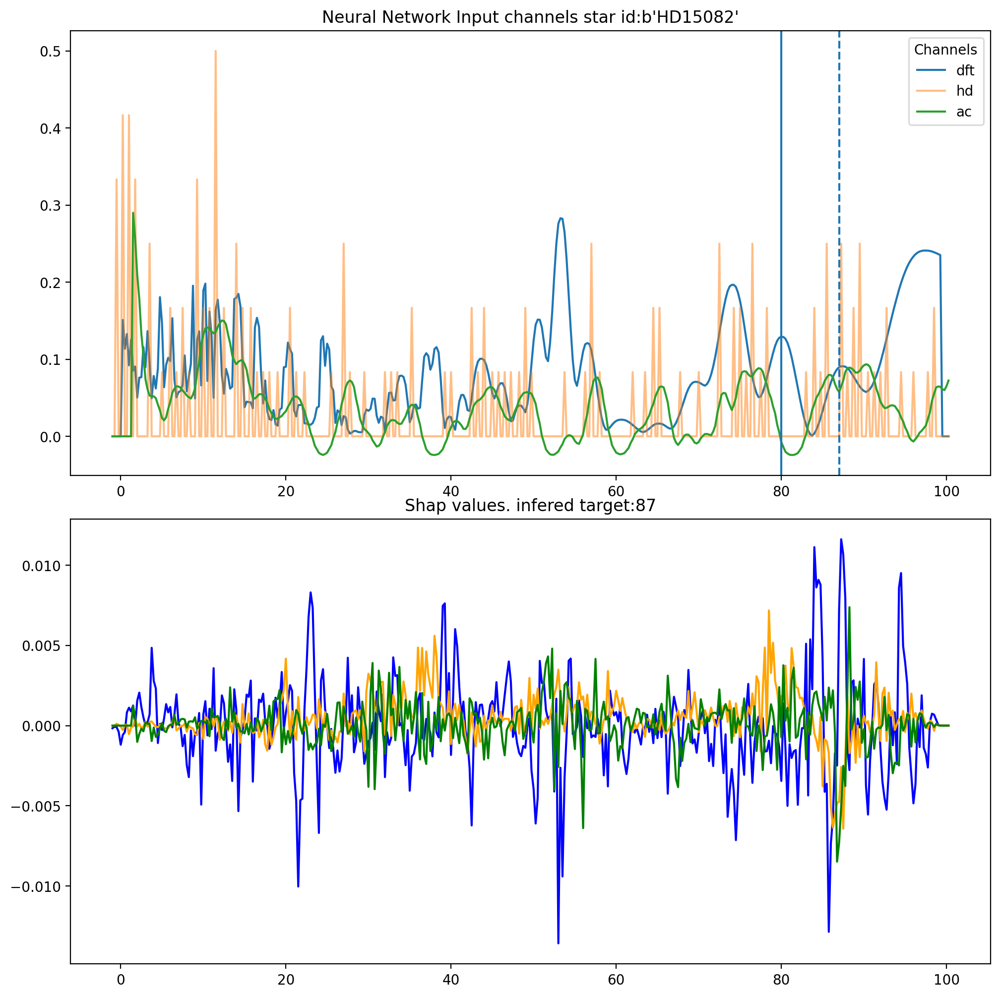

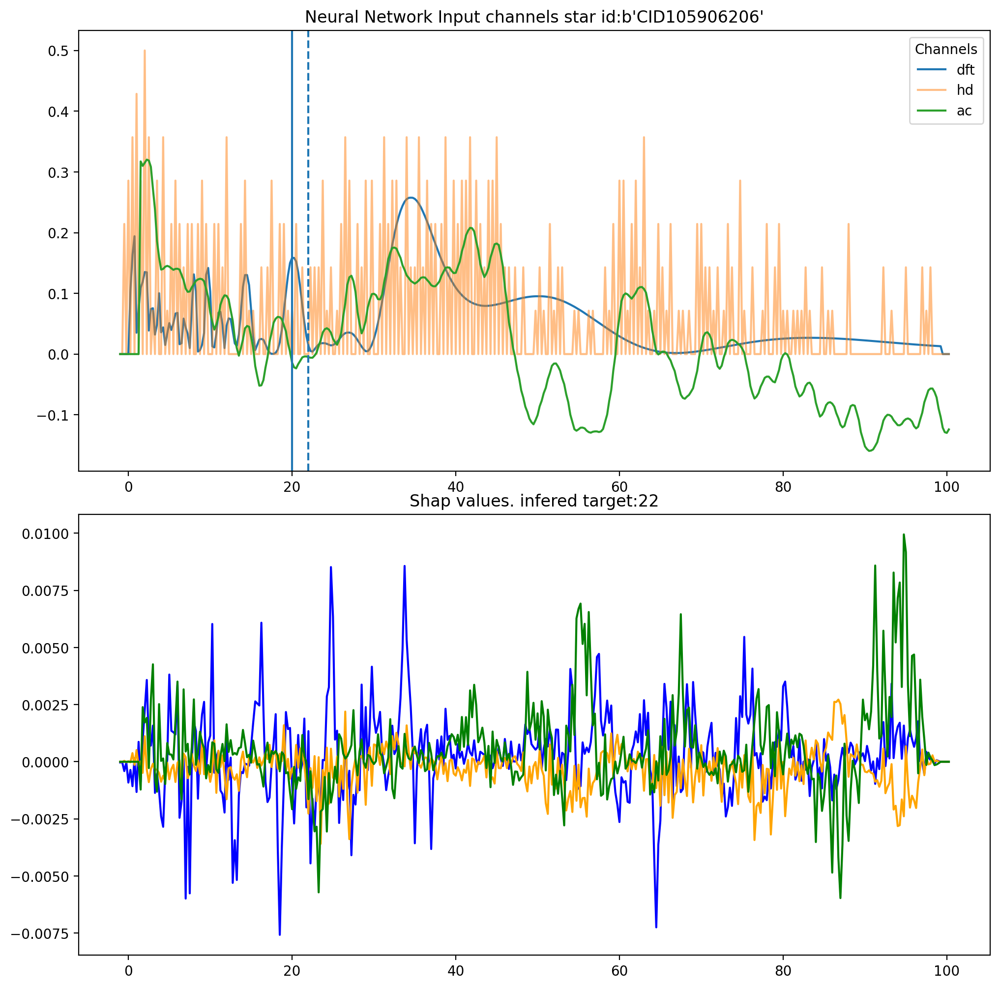

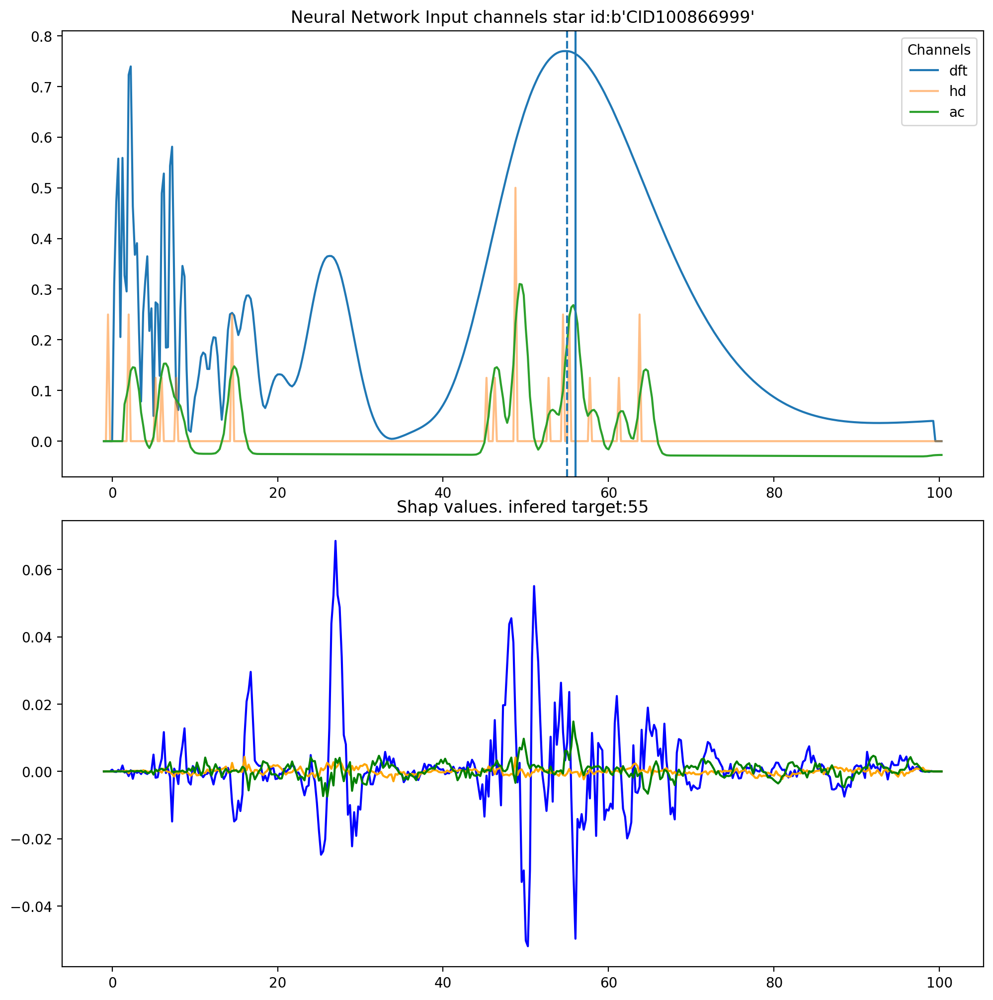

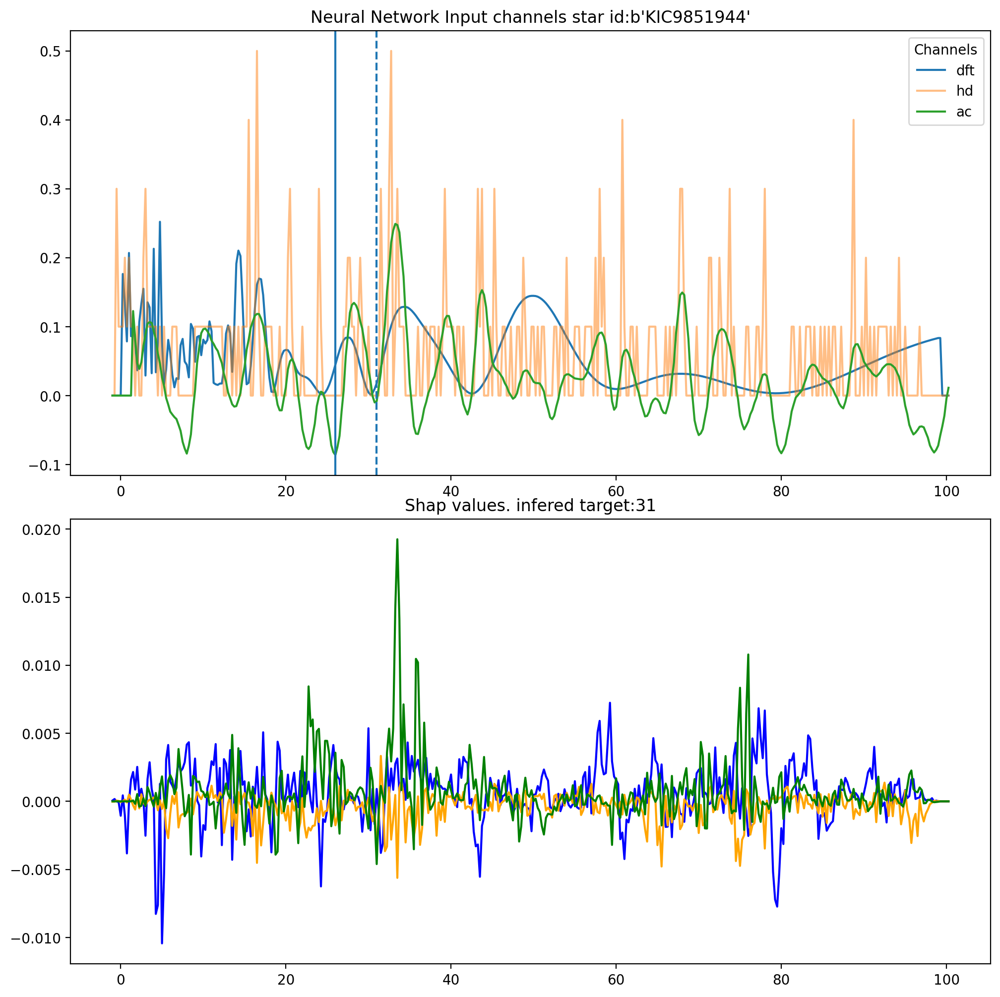

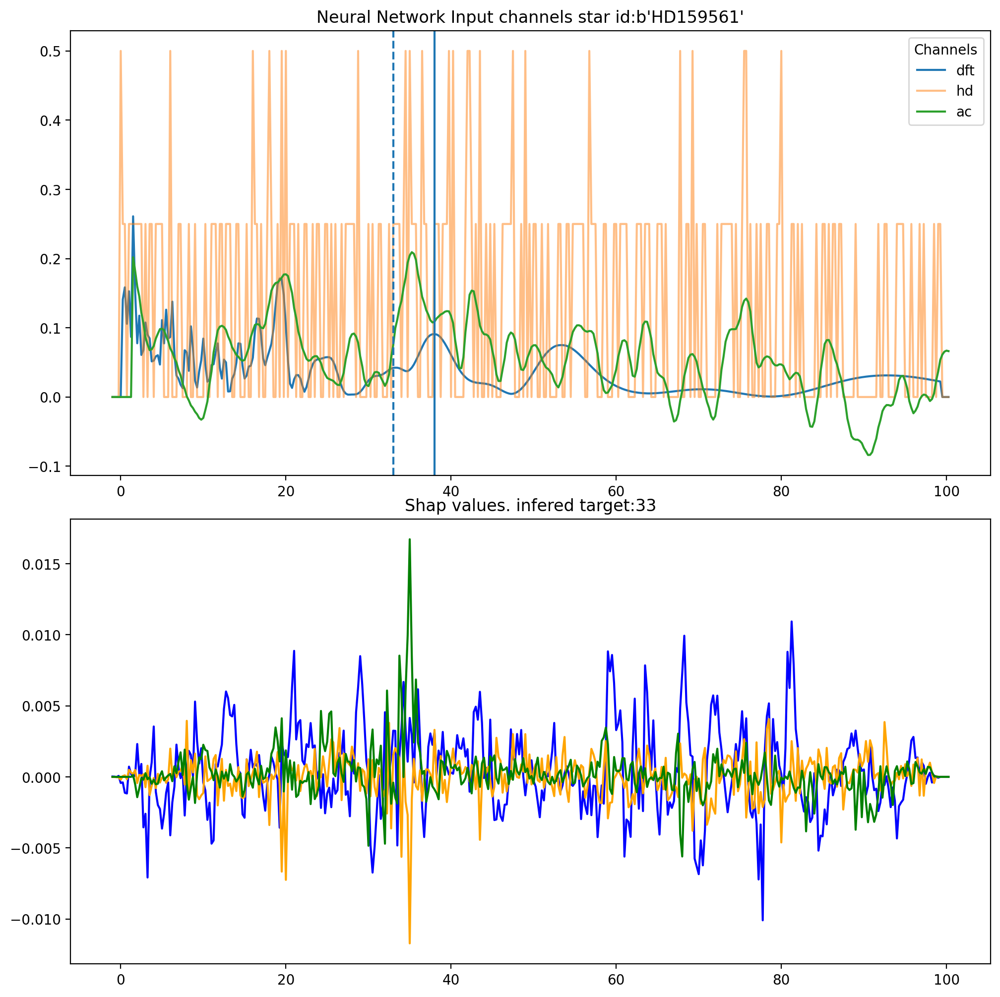

...

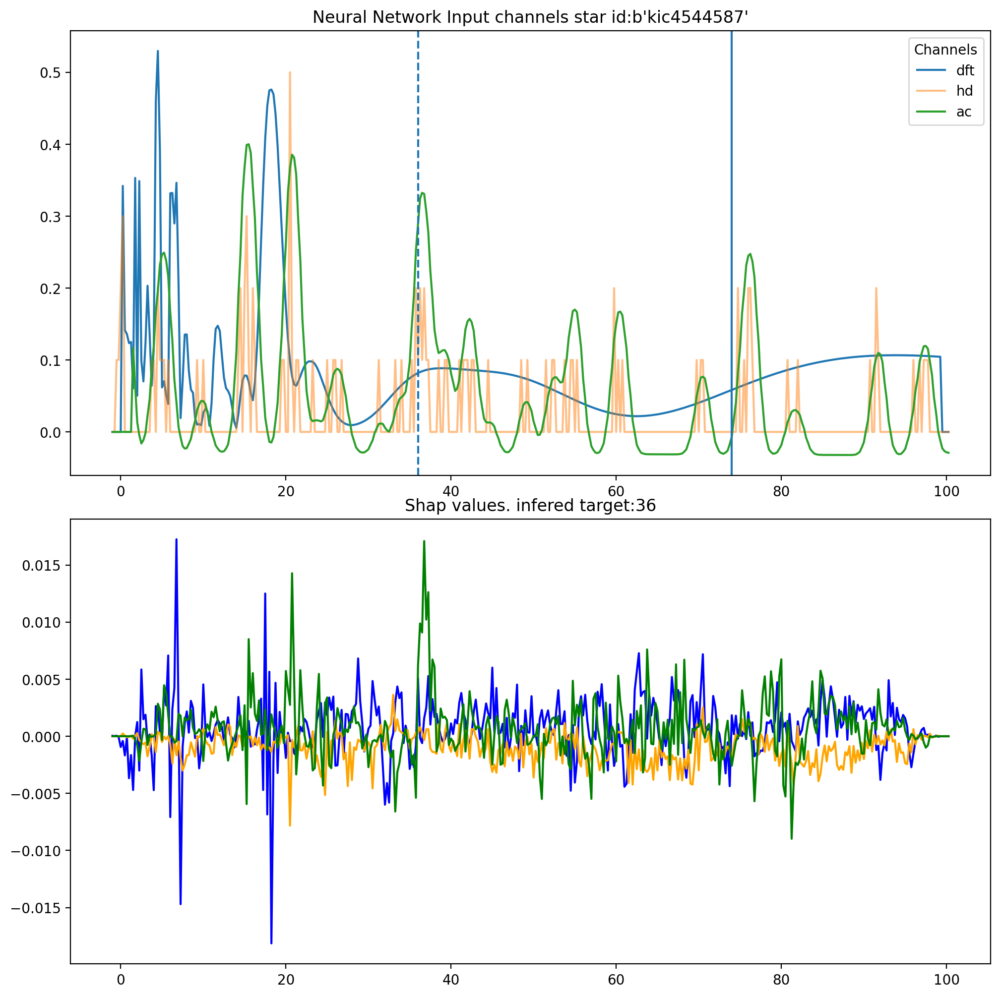

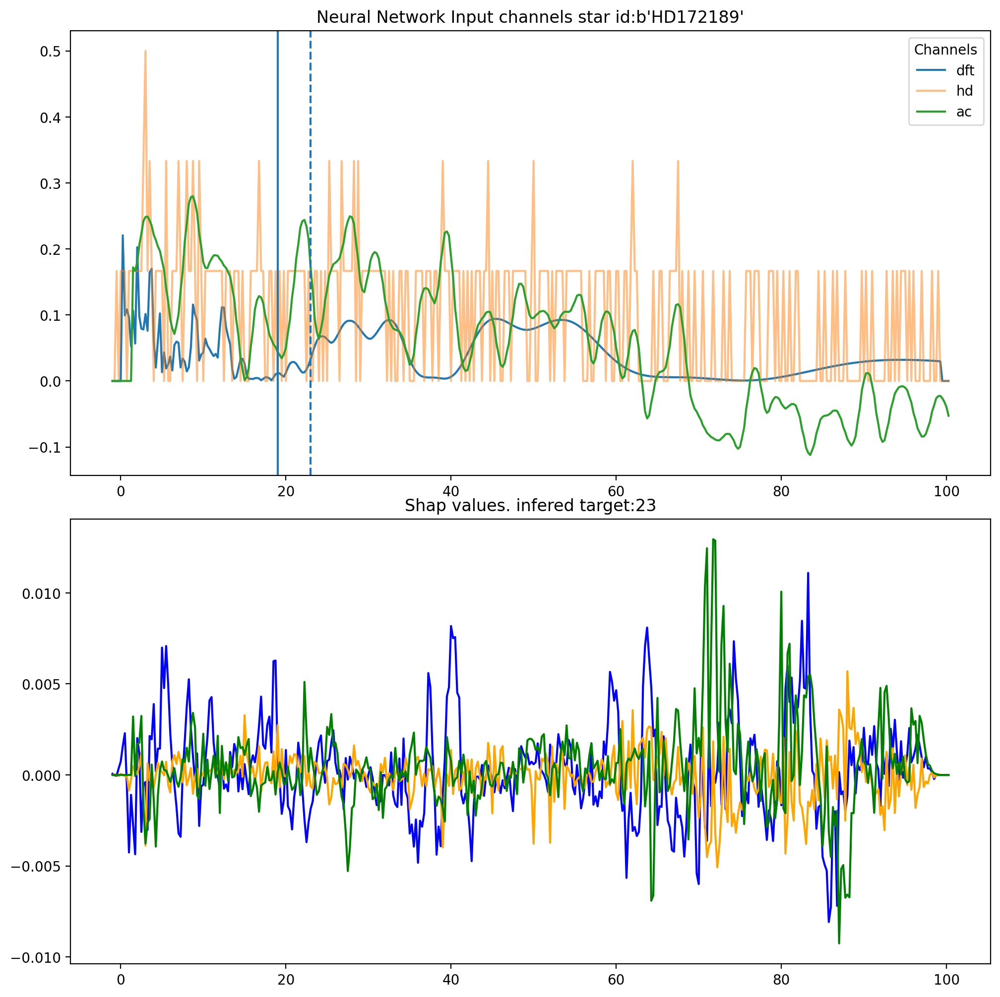

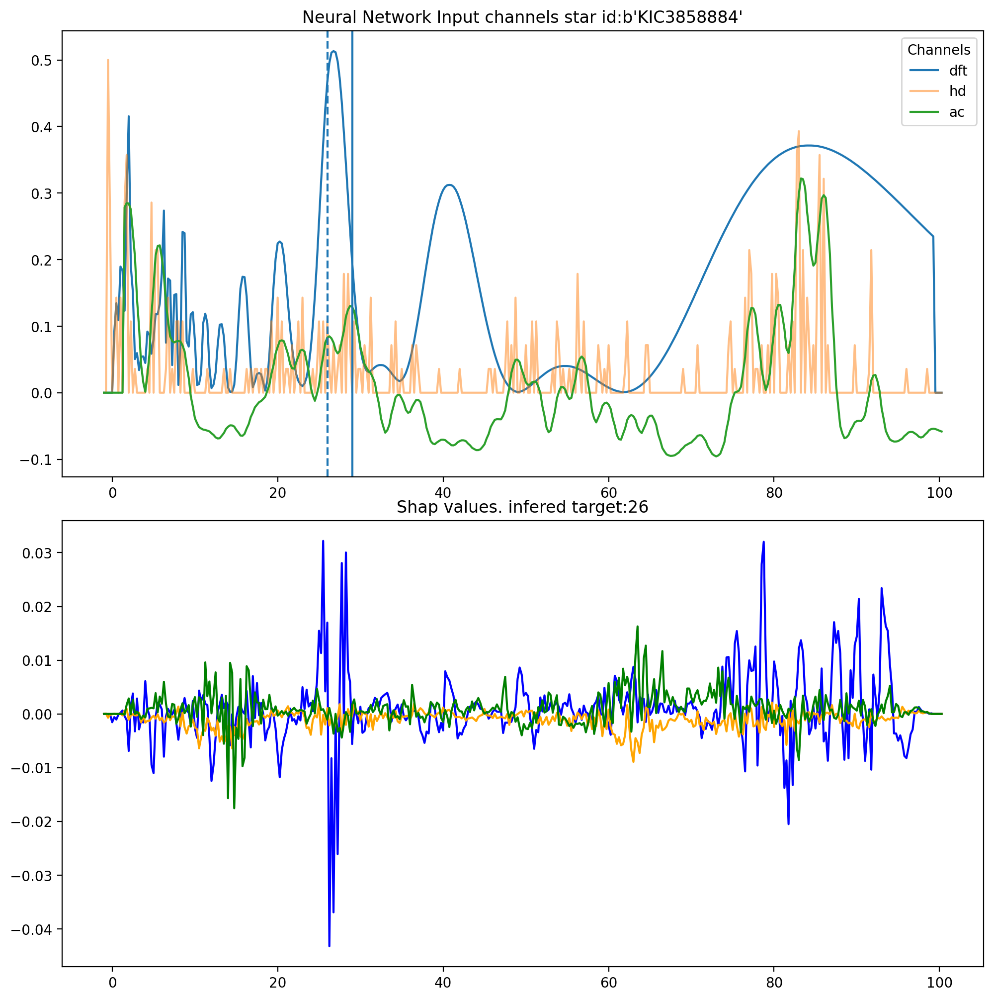

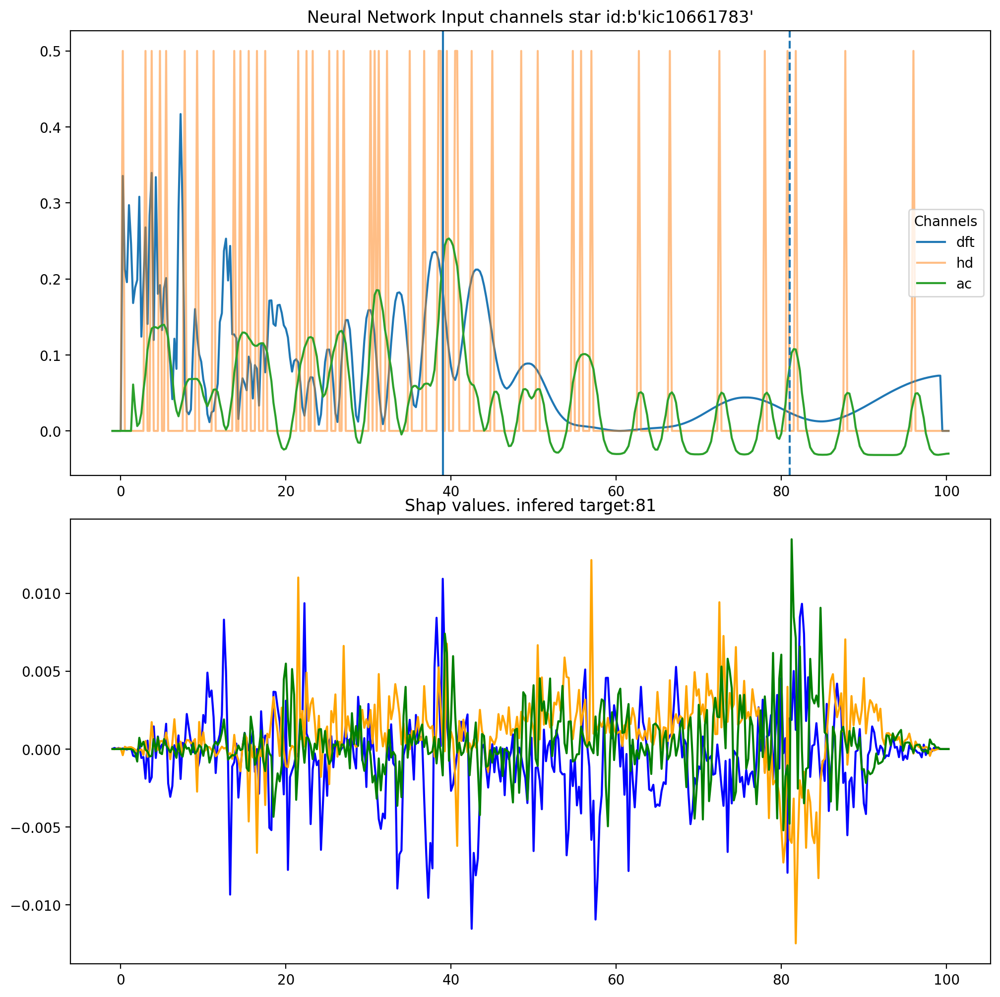

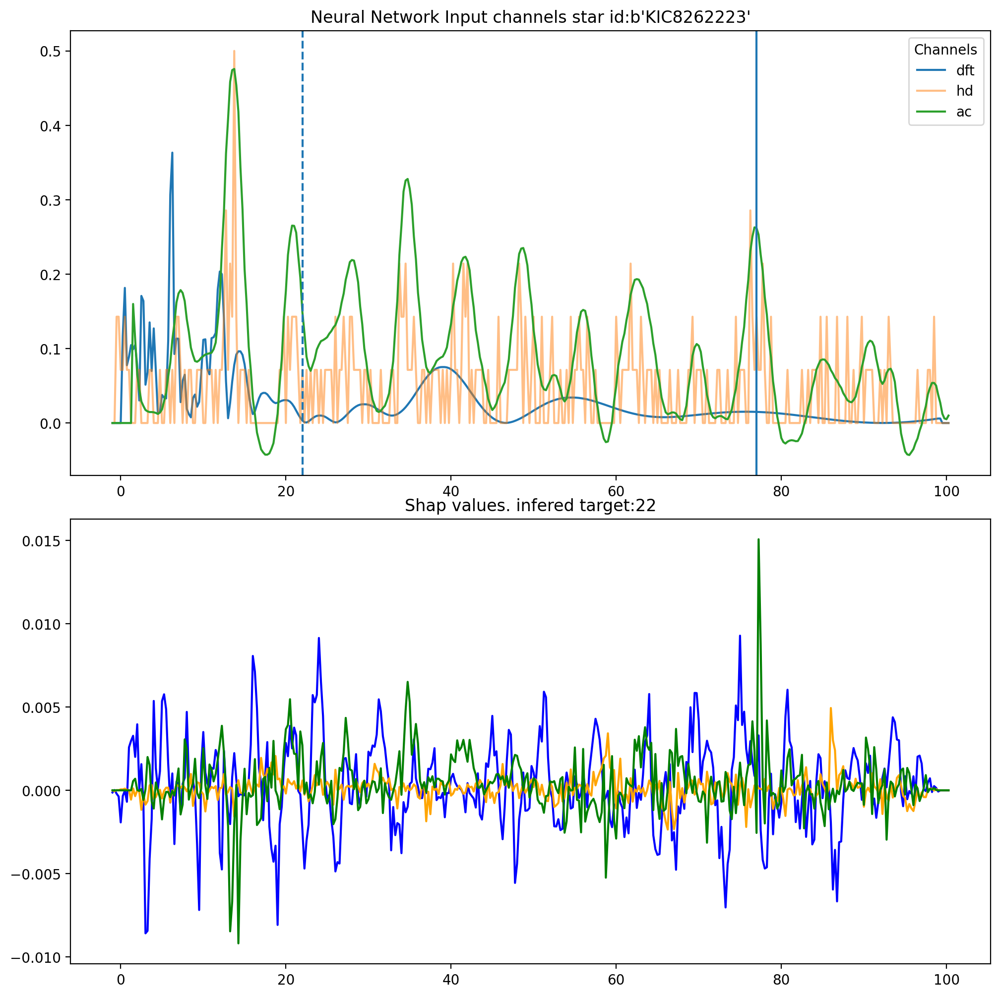

In [7]:
# Read datasets of preprocessed stars
df_ds = deltascuti()
df = df_ds.load("../../astronn/data/deltascuti/preprocessed/*", batch_size=1)
# Read star models (trainning) to calculate shap values
star_models = starmodels()
df_sm = star_models.load("/home/roberto/Downloads/dataall_parts/*", batch_size=150, add_noise=True)
_train_shap = np.asarray([line[0].numpy() for line in df_sm.take(10)])
_train_shap = _train_shap.reshape(
    (
        _train_shap.shape[0] * _train_shap.shape[1],
        _train_shap.shape[2],
        _train_shap.shape[3],
    )
)
number_shap_plots = 1
# Load model
sepconv_mod = tf.keras.models.load_model("/tmp/sepconvnn_tmp_400")
sepconv_mod.summary()

x = np.arange(-1, 100.5, 0.25)  # x axis from 0 to 100

# Save results and predictions
results = {}
for star in df.take(11):  # take the 11 ds stars
    target = np.where(star[2].numpy().flat == 1)[0].flat[0]

    # Plot information about ds star
    fig, subplots = plt.subplots(number_shap_plots+1, figsize=(10, 10), dpi=200)
    fig.tight_layout()

    subplots[0].plot(x, star[1][0, :, 0].numpy(), label="dft")
    subplots[0].plot(x, star[1][0, :, 1].numpy(), alpha=0.5, label="hd")
    subplots[0].plot(x, star[1][0, :, 2].numpy(), label="ac")
    target = np.where(star[2].numpy().flat == 1)[0].flat[0]
    subplots[0].axvline(x=target)
    subplots[0].axvline(x=sepconv_mod.predict_classes(star[1]), linestyle="--")
    # Calculate gradient explainers and shap values
    e = shap.GradientExplainer(
        sepconv_mod, _train_shap, batch_size=10, local_smoothing=0
    )
    shap_values, indexes = e.shap_values(
        star[1].numpy(), nsamples=100, ranked_outputs=10
    )
    print(str(star[0].numpy()[0]))
    print(indexes)
    print("")
    # Plot shap
    for idx in range(number_shap_plots):
        subplots[idx+1].plot(x, shap_values[idx][0][:, [0]], label="dft", linestyle="solid", color="blue")
        subplots[idx+1].plot(x, shap_values[idx][0][:, [1]], label="hd", linestyle="solid", color="orange")
        subplots[idx+1].plot(x, shap_values[idx][0][:, [2]], label="ac", linestyle="solid", color="green")
        subplots[idx+1].title.set_text("Shap values" + ". infered target:"+ str(indexes[0][idx]))

    subplots[0].legend(title="Channels")
    subplots[0].title.set_text("Neural Network Input channels" + " star id:" + str(star[0].numpy()[0]))
    fig.show()

    # Save results
    if str(star[0].numpy()[0]) not in results:
        results[str(star[0].numpy()[0])] = {"inference":sepconv_mod.predict_classes(star[1]), "target":target}

In [8]:
targets = []
ids = []
inferences = []
for star in results:
    ids.append(star)
    targets.append(results[star]["target"])
    inferences.append(results[star]["inference"])

Text(0, 0.5, &#39;NN Inference ($\\mu$Hz)&#39;)

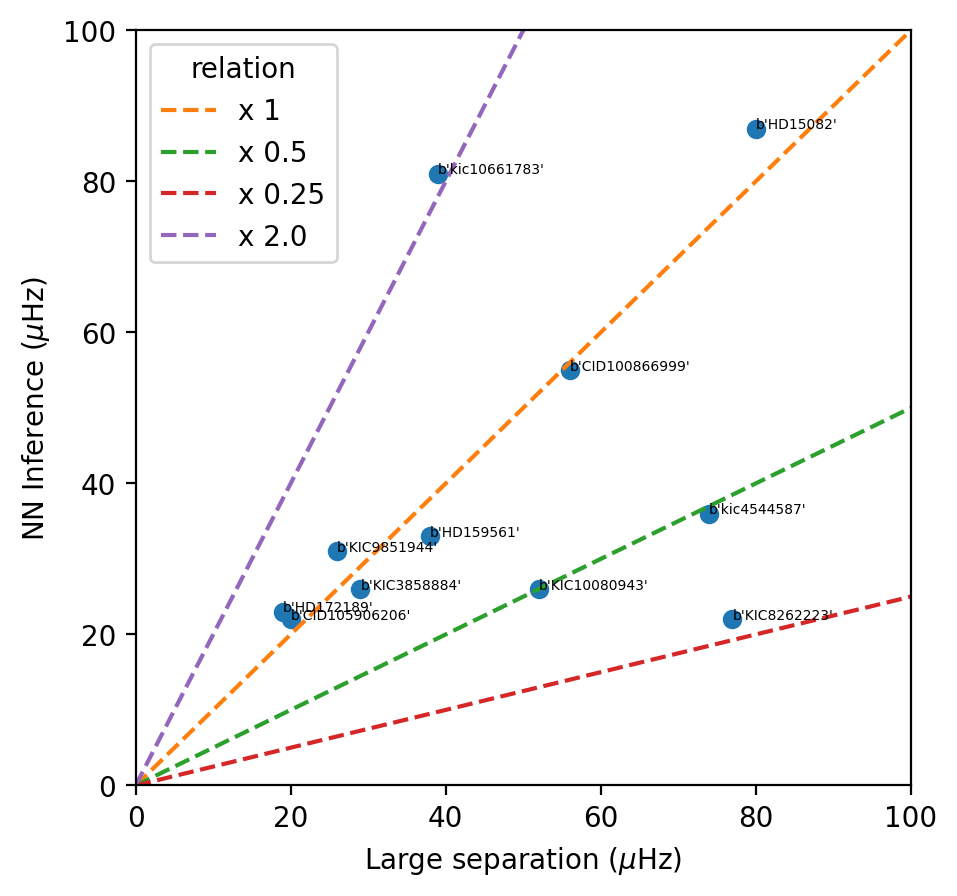

In [9]:
def abline(slope, intercept):
    """Plot a line from slope and intercept"""
    axes = plt.gca()
    x_vals = np.array(axes.get_xlim())
    y_vals = intercept + slope * x_vals
    plt.plot(x_vals, y_vals, '--', label="x "+str(slope))
    
# Set lims
plt.subplots(1, figsize=(5, 5), dpi=200)
plt.xlim(0, 100)
plt.ylim(0, 100)
plt.plot(targets, inferences, "o") # Plot relation
for i, txt in enumerate(ids):
    plt.annotate(txt, (targets[i], inferences[i]), size=5)

# Add multiple and submultiples
abline(1, 0)
abline(0.5, 0)
abline(0.25, 0)
abline(2.0, 0)
plt.legend(title="relation")
plt.xlabel("Large separation ($\mu$Hz)")
plt.ylabel("NN Inference ($\mu$Hz)")

In [10]:
cid = None
for star in df.take(11):  # take the 11 ds stars
    print(str(star[0].numpy()[0]))
    if star[0].numpy()[0].decode("utf-8") == 'CID100866999':
        cid = star

b&#39;CID100866999&#39;
b&#39;HD15082&#39;
b&#39;KIC3858884&#39;
b&#39;HD172189&#39;
b&#39;CID105906206&#39;
b&#39;kic4544587&#39;
b&#39;KIC9851944&#39;
b&#39;kic10661783&#39;
b&#39;KIC10080943&#39;
b&#39;KIC8262223&#39;
b&#39;HD159561&#39;


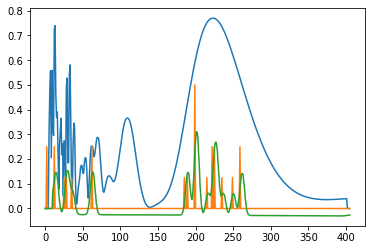

Instructions for updating:
Please use `model.predict()` instead.


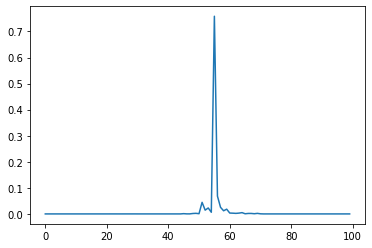

In [11]:
# Plot sample star
x = cid[1].numpy()

# Modify values
#x[0, 0:400, 0] = 0.5

plt.plot(x[0, :, 0])
plt.plot(x[0, :, 1])
plt.plot(x[0, :, 2])
plt.show()
plt.plot(sepconv_mod.predict_proba(x)[0][0:100])
plt.show()

## CoRoT 75 stars study

In [12]:
vrrhosun = 1.409
vrloggsun = 4.44

def getRhoFromDnu(Dnu, e_Dnu=0):
    """
    calculate Rho from Dnu estimating the error produced
    """
    rho_sun = 1.409
    dnu_sun = 134.8
    a = 1.501
    e_a = 0.096
    b = 2.0373
    e_b = 0.0405
    rho = (a * (Dnu / dnu_sun) ** b) * rho_sun
    e_rho = rho * np.sqrt(
        (e_a / a) ** 2
        + (b * e_Dnu / (Dnu * dnu_sun)) ** 2
        + (np.log10(Dnu / dnu_sun) * e_b) ** 2
    )
    return {"rho": rho, "error": e_rho}


def get_radio_from_rho(rho, e_rho):
    """
    calculate radio from rho, estimating max and min values
    """
    R_min = (1.5 / (rho + e_rho) / vrrhosun) ** (1 / 3)
    R_max = (3 / (rho - e_rho) / vrrhosun) ** (1 / 3)
    return {"r_min": R_min, "r_max": R_max}


def get_logg_from_radio(R_max, R_min):
    """
    calculate logg from radio estimating max and min values
    """
    logg_min = np.log10(1.5 / R_max ** 2) + vrloggsun
    logg_max = np.log10(3 / R_min ** 2) + vrloggsun
    return {"logg_min": logg_min, "logg_max": logg_max}

# Test
rhos = getRhoFromDnu(26, 4)
radios = get_radio_from_rho(rhos["rho"], rhos["error"])
loggs_condifence = get_logg_from_radio(radios["r_max"], radios["r_min"])
loggs_average = (loggs_condifence["logg_max"] + loggs_condifence["logg_min"]) / 2
print(loggs_average)
print(loggs_condifence)

3.893559849137816
{&#39;logg_min&#39;: 3.622331070953697, &#39;logg_max&#39;: 4.1647886273219346}


In [13]:
def get_logg_confidence(dnu_hat):
    """
    """
    rhos = getRhoFromDnu(dnu_hat, 4)
    radios = get_radio_from_rho(rhos["rho"], rhos["error"])
    loggs_condifence = get_logg_from_radio(radios["r_max"], radios["r_min"])
    # Get central point of logg confidence
    loggs_average = (loggs_condifence["logg_max"] + loggs_condifence["logg_min"]) / 2
    return loggs_condifence

Counter({True: 1})
Counter({True: 1})
CoRoT ID: 102641760
Shap values (sorted): [[59 60 61 58 62 63 64 50 49 57 51 65 48 40 41 66 52 42 31 43 39 44 32 30
  38 75 56 46 53 76 47 67 45 37 77 33 68 69 36 71]]
Logg from Hareter: 4.3
Avg logg from NN: [4.37700602]
Confidence logg from NN: {&#39;logg_min&#39;: array([4.10712847]), &#39;logg_max&#39;: array([4.64688357])}
Logg from Hareter is inside NN confidence=: [ True]
[[52.0018963 ]
 [66.7677538 ]
 [38.55761583]]
{&#39;logg_min&#39;: array([4.03249033]), &#39;logg_max&#39;: array([4.57255353])}
{&#39;logg_min&#39;: array([4.18022301]), &#39;logg_max&#39;: array([4.71971688])}
{&#39;logg_min&#39;: array([3.85557227]), &#39;logg_max&#39;: array([4.39652711])}


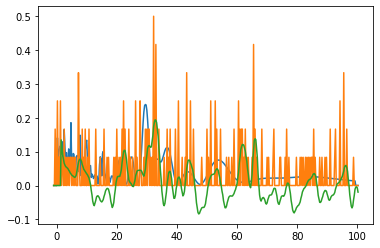

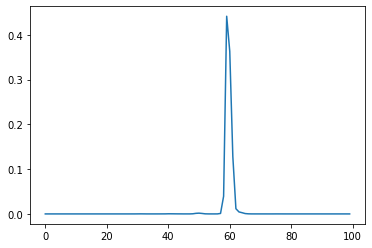

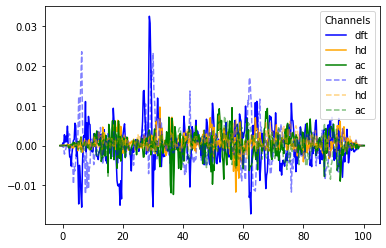



Counter({True: 1, False: 1})
Counter({True: 2})
CoRoT ID: 102587554
Shap values (sorted): [[30 31 29 32 33 39 28 38 37 40 34 27 35 42 43 36 41 44 26 23 45 21 22 24
  46 47 25 50 20 19 49 48 51 18 52 53 17 16 58 54]]
Logg from Hareter: 3.7
Avg logg from NN: [3.97798961]
Confidence logg from NN: {&#39;logg_min&#39;: array([3.70705438]), &#39;logg_max&#39;: array([4.24892483])}
Logg from Hareter is inside NN confidence=: [False]
[[48.23545035]
 [34.33066825]
 [21.67333493]]
{&#39;logg_min&#39;: array([3.98803301]), &#39;logg_max&#39;: array([4.5282992])}
{&#39;logg_min&#39;: array([3.78686469]), &#39;logg_max&#39;: array([4.32822474])}
{&#39;logg_min&#39;: array([3.51453379]), &#39;logg_max&#39;: array([4.05780339])}


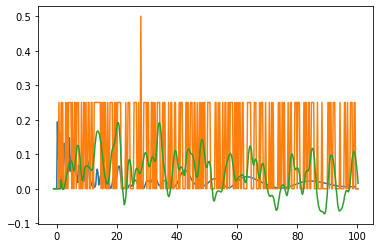

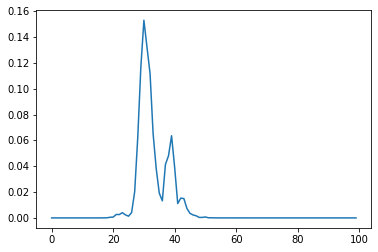

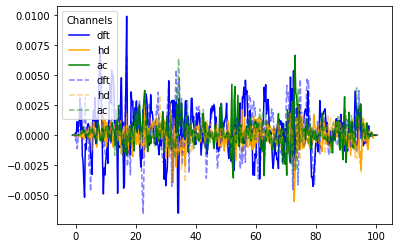



Counter({True: 2, False: 1})
Counter({True: 3})
CoRoT ID: 102634888
Shap values (sorted): [[28 29 27 30 20 22 19 23 26 31 21 24 25 32 33 18 34 35 36 17 38 37 39 40
  42 41 16 44 43 45 13 46 47 49 48 50 15 51 14 52]]
Logg from Hareter: 4.0
Avg logg from NN: [3.93728393]
Confidence logg from NN: {&#39;logg_min&#39;: array([3.66621005]), &#39;logg_max&#39;: array([4.2083578])}
Logg from Hareter is inside NN confidence=: [ True]
[[46.32958136]
 [20.19660053]
 [33.99044832]]
{&#39;logg_min&#39;: array([3.9641925]), &#39;logg_max&#39;: array([4.50457345])}
{&#39;logg_min&#39;: array([3.47272943]), &#39;logg_max&#39;: array([4.01633296])}
{&#39;logg_min&#39;: array([3.78097062]), &#39;logg_max&#39;: array([4.32236692])}


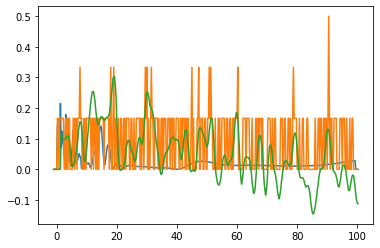

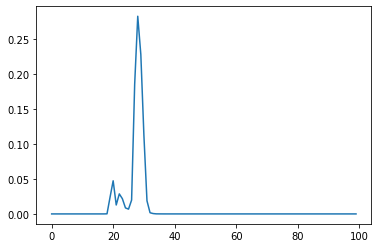

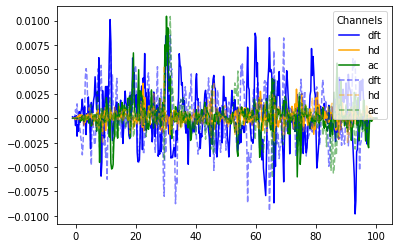



Counter({True: 2, False: 2})
Counter({True: 3, False: 1})
CoRoT ID: 102788412
Shap values (sorted): [[92 91 90 93 69 67 85 68 87 89 86 70 88 84 66 71 94 72 83 79 78 97 96 99
  95 65 98 82 77 73 81 76 80 75 74 64 63 62 59 58]]
Logg from Hareter: 3.925
Avg logg from NN: [4.63907568]
Confidence logg from NN: {&#39;logg_min&#39;: array([4.36957119]), &#39;logg_max&#39;: array([4.90858018])}
Logg from Hareter is inside NN confidence=: [False]
[[92.3587022 ]
 [66.19538569]
 [79.20843175]]
{&#39;logg_min&#39;: array([4.37186875]), &#39;logg_max&#39;: array([4.91087358])}
{&#39;logg_min&#39;: array([4.17513565]), &#39;logg_max&#39;: array([4.71464638])}
{&#39;logg_min&#39;: array([4.28116397]), &#39;logg_max&#39;: array([4.82036446])}


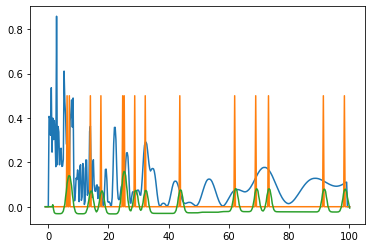

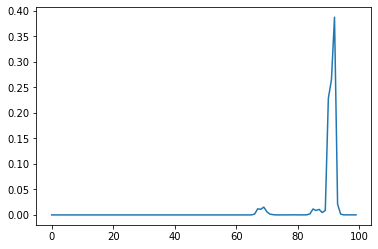

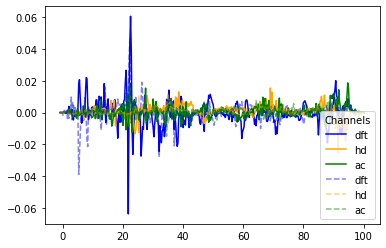



Counter({False: 3, True: 2})
Counter({True: 3, False: 2})
CoRoT ID: 102575808
Shap values (sorted): [[32 33 25 24 22 23 31 34 21 26 30 35 29 20 36 28 27 19 37 38 39 40 44 42
  41 45 46 18 43 17 53 47 52 54 51 48 50 55 49 56]]
Logg from Hareter: 3.325
Avg logg from NN: [4.01606683]
Confidence logg from NN: {&#39;logg_min&#39;: array([3.74525639]), &#39;logg_max&#39;: array([4.28687728])}
Logg from Hareter is inside NN confidence=: [False]
[[50.32958136]
 [24.19660053]
 [37.99044832]]
{&#39;logg_min&#39;: array([4.01316341]), &#39;logg_max&#39;: array([4.55331308])}
{&#39;logg_min&#39;: array([3.57976237]), &#39;logg_max&#39;: array([4.12253204])}
{&#39;logg_min&#39;: array([3.84680458]), &#39;logg_max&#39;: array([4.38780934])}


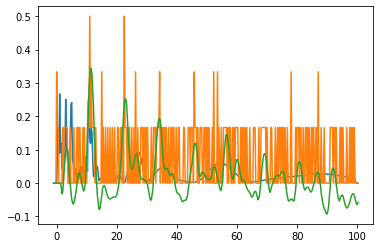

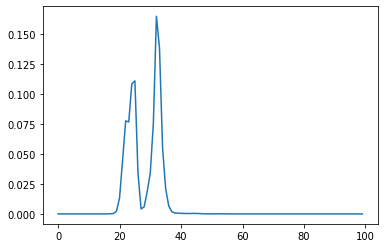

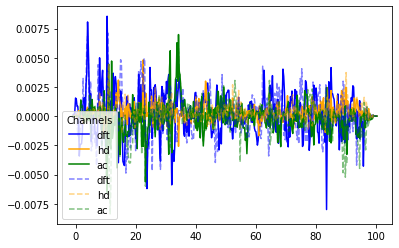



Counter({False: 4, True: 2})
Counter({True: 4, False: 2})
CoRoT ID: 102691322
Shap values (sorted): [[81 82 71 83 70 69 79 80 78 68 72 56 57 77 84 55 67 54 58 53 73 76 66 85
  41 52 46 37 65 59 47 75 36 40 51 49 64 39 38 74]]
Logg from Hareter: 4.05
Avg logg from NN: [4.56395828]
Confidence logg from NN: {&#39;logg_min&#39;: array([4.2943743]), &#39;logg_max&#39;: array([4.83354226])}
Logg from Hareter is inside NN confidence=: [False]
[[74.24209855]
 [53.01137827]
 [38.47903603]]
{&#39;logg_min&#39;: array([4.24291556]), &#39;logg_max&#39;: array([4.78221792])}
{&#39;logg_min&#39;: array([4.04385761]), &#39;logg_max&#39;: array([4.58387123])}
{&#39;logg_min&#39;: array([3.85436527]), &#39;logg_max&#39;: array([4.39532695])}


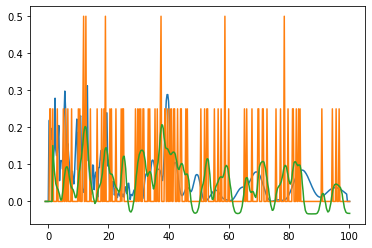

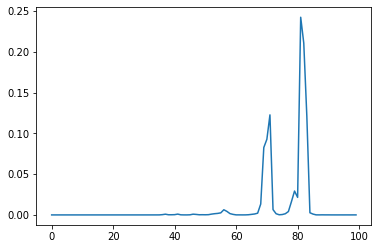

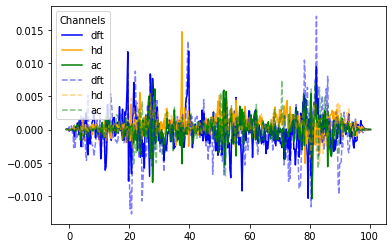



Counter({False: 4, True: 3})
Counter({True: 5, False: 2})
CoRoT ID: 102647323
Shap values (sorted): [[40 41 39 38 42 43 37 50 49 51 44 31 32 33 34 36 27 30 28 45 35 29 48 26
  46 52 47 24 25 58 23 57 20 22 59 21 53 56 60 55]]
Logg from Hareter: 4.3
Avg logg from NN: [4.14771683]
Confidence logg from NN: {&#39;logg_min&#39;: array([3.87730012]), &#39;logg_max&#39;: array([4.41813355])}
Logg from Hareter is inside NN confidence=: [ True]
[[27.20322633]
 [54.34966821]
 [41.52692886]]
{&#39;logg_min&#39;: array([3.64911768]), &#39;logg_max&#39;: array([4.19138466])}
{&#39;logg_min&#39;: array([4.05859745]), &#39;logg_max&#39;: array([4.59854818])}
{&#39;logg_min&#39;: array([3.89946208]), &#39;logg_max&#39;: array([4.44017505])}


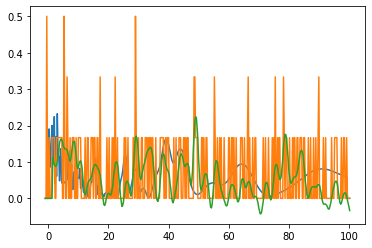

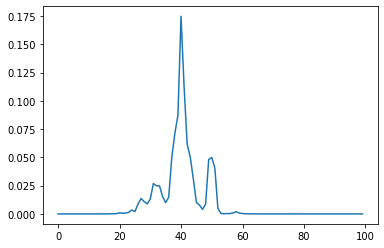

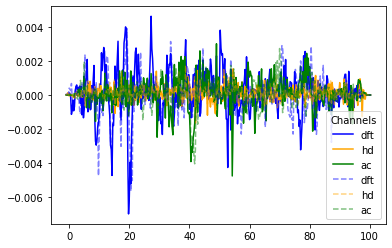



Counter({True: 4, False: 4})
Counter({True: 6, False: 2})
CoRoT ID: 102637079
Shap values (sorted): [[28 27 29 26 23 21 20 25 30 24 22 31 19 32 33 34 35 36 37 18 38 41 40 39
  42 43 16 44 17 45 46 13 47 48 49 15 50 51 52 14]]
Logg from Hareter: 3.85
Avg logg from NN: [3.93728393]
Confidence logg from NN: {&#39;logg_min&#39;: array([3.66621005]), &#39;logg_max&#39;: array([4.2083578])}
Logg from Hareter is inside NN confidence=: [ True]
[[31.00955168]
 [44.80339947]
 [18.67041864]]
{&#39;logg_min&#39;: array([3.72664652]), &#39;logg_max&#39;: array([4.26838779])}
{&#39;logg_min&#39;: array([3.94438169]), &#39;logg_max&#39;: array([4.4848611])}
{&#39;logg_min&#39;: array([3.42617594]), &#39;logg_max&#39;: array([3.97016355])}


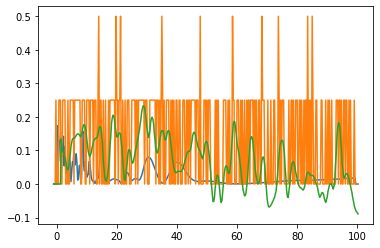

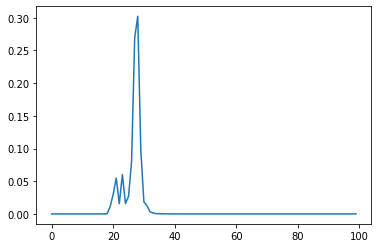

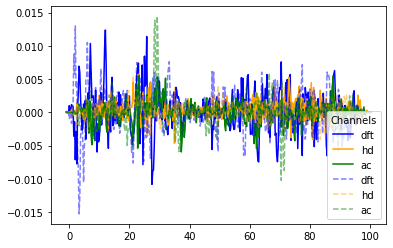



Counter({True: 5, False: 4})
Counter({True: 7, False: 2})
CoRoT ID: 102753236
Shap values (sorted): [[30 29 27 31 24 28 25 26 23 32 33 22 40 38 39 21 35 20 34 37 41 42 36 19
  43 44 45 46 47 18 17 48 49 16 13 50 53 51 54 52]]
Logg from Hareter: 4.1
Avg logg from NN: [3.97798961]
Confidence logg from NN: {&#39;logg_min&#39;: array([3.70705438]), &#39;logg_max&#39;: array([4.24892483])}
Logg from Hareter is inside NN confidence=: [ True]
[[33.63387237]
 [47.31330518]
 [20.72783752]]
{&#39;logg_min&#39;: array([3.77472939]), &#39;logg_max&#39;: array([4.31616433])}
{&#39;logg_min&#39;: array([3.97661812]), &#39;logg_max&#39;: array([4.51693875])}
{&#39;logg_min&#39;: array([3.48811062]), &#39;logg_max&#39;: array([4.03159007])}


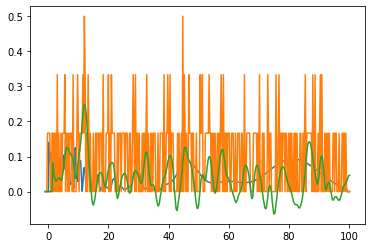

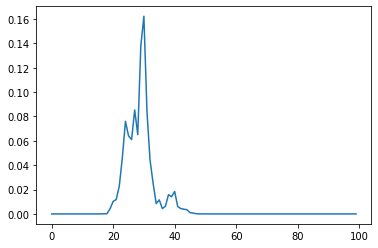

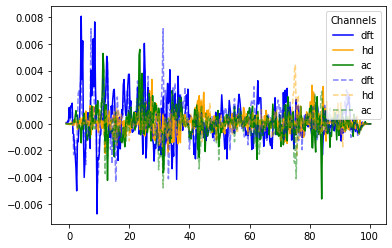



Counter({True: 5, False: 5})
Counter({True: 7, False: 3})
CoRoT ID: 102673795
Shap values (sorted): [[98 96 97 99 95 48 46 47 94 49 64 65 66 81 45 82 50 67 62 63 78 93 84 85
  86 92 79 77 83 89 61 76 69 80 44 91 88 87 70 68]]
Logg from Hareter: 3.75
Avg logg from NN: [4.67634431]
Confidence logg from NN: {&#39;logg_min&#39;: array([4.40687092]), &#39;logg_max&#39;: array([4.9458177])}
Logg from Hareter is inside NN confidence=: [False]
[[65.37321493]
 [87.06752512]
 [46.99999499]]
{&#39;logg_min&#39;: array([4.16775028]), &#39;logg_max&#39;: array([4.70728586])}
{&#39;logg_min&#39;: array([4.33703356]), &#39;logg_max&#39;: array([4.87610585])}
{&#39;logg_min&#39;: array([3.97268896]), &#39;logg_max&#39;: array([4.51302854])}


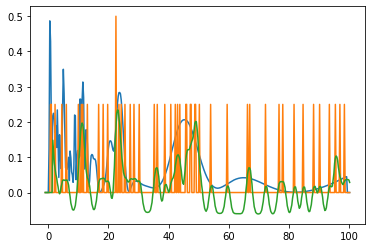

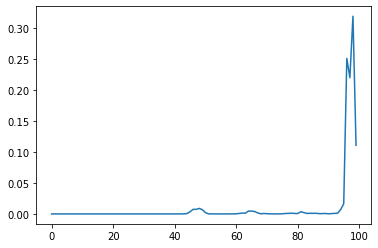

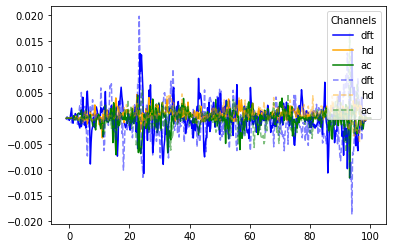



Counter({True: 6, False: 5})
Counter({True: 8, False: 3})
CoRoT ID: 102728240
Shap values (sorted): [[35 36 34 33 37 38 32 39 31 43 40 42 27 28 30 44 41 29 45 26 51 52 48 25
  53 49 47 24 46 50 54 23 55 22 21 56 57 20 63 64]]
Logg from Hareter: 4.2
Avg logg from NN: [4.06893667]
Confidence logg from NN: {&#39;logg_min&#39;: array([3.79829145]), &#39;logg_max&#39;: array([4.33958189])}
Logg from Hareter is inside NN confidence=: [ True]
[[41.05963106]
 [27.09019244]
 [53.63450344]]
{&#39;logg_min&#39;: array([3.89276761]), &#39;logg_max&#39;: array([4.43351661])}
{&#39;logg_min&#39;: array([3.64665233]), &#39;logg_max&#39;: array([4.18893667])}
{&#39;logg_min&#39;: array([4.05076652]), &#39;logg_max&#39;: array([4.59075046])}


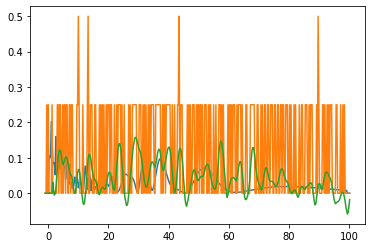

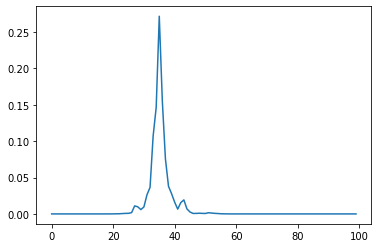

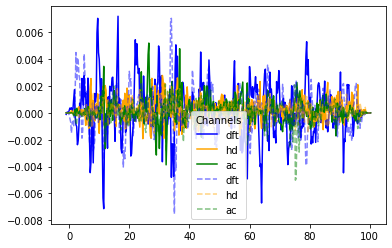



Counter({True: 7, False: 5})
Counter({True: 9, False: 3})
CoRoT ID: 102599598
Shap values (sorted): [[20 23 22 21 24 19 25 26 27 28 18 29 30 31 32 33 34 35 36 37 38 17 16 39
  40 41 42 43 44 13 46 45 47 48 15 49 14 50  0  9]]
Logg from Hareter: 4.0
Avg logg from NN: [3.73875947]
Confidence logg from NN: {&#39;logg_min&#39;: array([3.46693415]), &#39;logg_max&#39;: array([4.0105848])}
Logg from Hareter is inside NN confidence=: [ True]
[[29.46082231]
 [43.50344562]
 [17.2691927 ]]
{&#39;logg_min&#39;: array([3.69631826]), &#39;logg_max&#39;: array([4.23826055])}
{&#39;logg_min&#39;: array([3.92696656]), &#39;logg_max&#39;: array([4.46753483])}
{&#39;logg_min&#39;: array([3.37994598]), &#39;logg_max&#39;: array([3.92432755])}


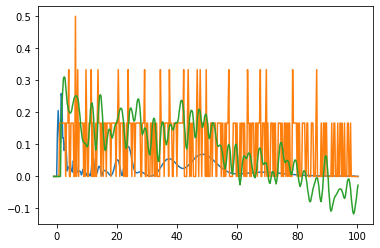

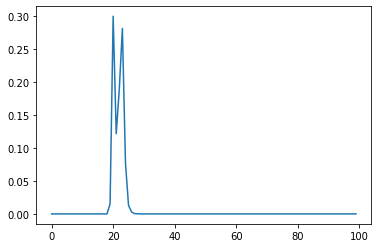

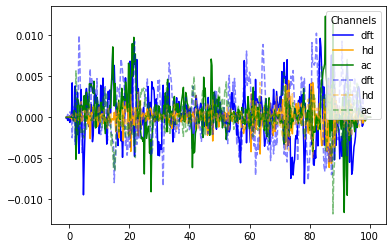



Counter({True: 7, False: 6})
Counter({True: 9, False: 4})
CoRoT ID: 102704304
Shap values (sorted): [[20 21 22 23 24 25 19 26 27 28 29 18 30 31 32 33 34 17 35 36 37 16 38 39
  40 41 13 42 43 44 15 45 46 14 47  9 48  0 49 10]]
Logg from Hareter: 3.25
Avg logg from NN: [3.73875947]
Confidence logg from NN: {&#39;logg_min&#39;: array([3.46693415]), &#39;logg_max&#39;: array([4.0105848])}
Logg from Hareter is inside NN confidence=: [False]
[[41.97555071]
 [15.78605278]
 [27.92151319]]
{&#39;logg_min&#39;: array([3.90581833]), &#39;logg_max&#39;: array([4.44649739])}
{&#39;logg_min&#39;: array([3.32672651]), &#39;logg_max&#39;: array([3.87157686])}
{&#39;logg_min&#39;: array([3.66454813]), &#39;logg_max&#39;: array([4.2067074])}


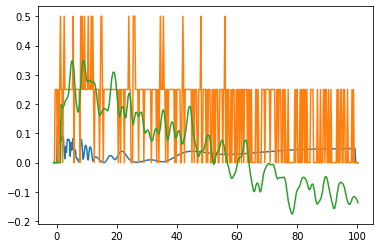

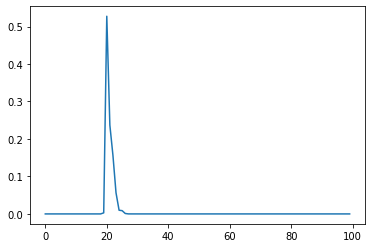

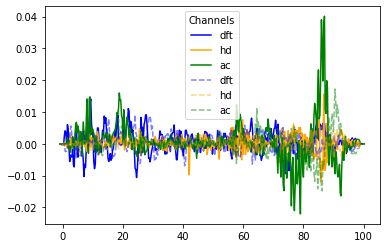



Counter({True: 7, False: 7})
Counter({True: 10, False: 4})
CoRoT ID: 102790482
Shap values (sorted): [[21 22 23 24 20 25 26 19 27 28 29 30 31 32 18 33 34 35 36 37 39 38 16 17
  40 41 13 42 43 44 45 47 46 48 49 50 15 51 52 53]]
Logg from Hareter: 3.475
Avg logg from NN: [3.76754718]
Confidence logg from NN: {&#39;logg_min&#39;: array([3.49583836]), &#39;logg_max&#39;: array([4.039256])}
Logg from Hareter is inside NN confidence=: [False]
[[33.55865668]
 [20.20125611]
 [46.81600368]]
{&#39;logg_min&#39;: array([3.77340441]), &#39;logg_max&#39;: array([4.31484758])}
{&#39;logg_min&#39;: array([3.47286597]), &#39;logg_max&#39;: array([4.0164684])}
{&#39;logg_min&#39;: array([3.97036931]), &#39;logg_max&#39;: array([4.51072013])}


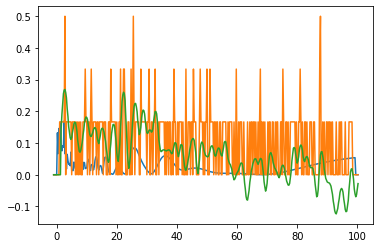

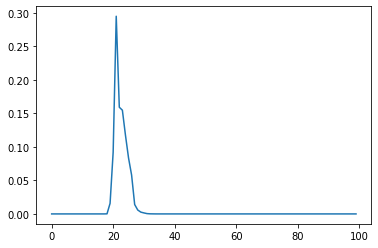

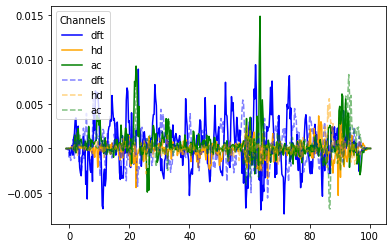



Counter({False: 8, True: 7})
Counter({True: 10, False: 5})
CoRoT ID: 102702932
Shap values (sorted): [[20 21 22 23 25 24 26 19 27 28 29 18 30 31 32 33 34 17 35 36 16 37 38 39
  40 13 41 42 43 15 44 45 46 14 47 48 49  0 50 10]]
Logg from Hareter: 3.35
Avg logg from NN: [3.73875947]
Confidence logg from NN: {&#39;logg_min&#39;: array([3.46693415]), &#39;logg_max&#39;: array([4.0105848])}
Logg from Hareter is inside NN confidence=: [False]
[[43.4862069 ]
 [17.68851318]
 [30.09076462]]
{&#39;logg_min&#39;: array([3.92673213]), &#39;logg_max&#39;: array([4.46730161])}
{&#39;logg_min&#39;: array([3.3941632]), &#39;logg_max&#39;: array([3.93842229])}
{&#39;logg_min&#39;: array([3.70884266]), &#39;logg_max&#39;: array([4.25070121])}


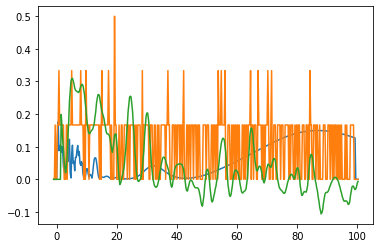

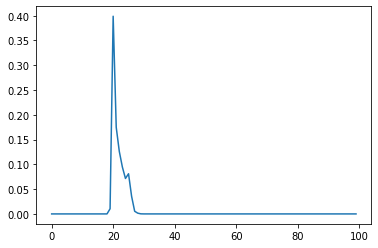

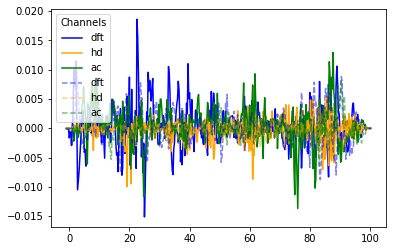



Counter({True: 8, False: 8})
Counter({True: 11, False: 5})
CoRoT ID: 102677987
Shap values (sorted): [[37 36 38 35 34 24 26 25 23 27 28 33 39 29 40 32 30 22 21 31 20 41 42 18
  19 16 43 44 17 45 54 53 46 48 51 52 47 55 49 50]]
Logg from Hareter: 3.95
Avg logg from NN: [4.10172168]
Confidence logg from NN: {&#39;logg_min&#39;: array([3.83117416]), &#39;logg_max&#39;: array([4.37226921])}
Logg from Hareter is inside NN confidence=: [ True]
[[49.32958136]
 [23.19660053]
 [36.99044832]]
{&#39;logg_min&#39;: array([4.00129646]), &#39;logg_max&#39;: array([4.54150058])}
{&#39;logg_min&#39;: array([3.55476561]), &#39;logg_max&#39;: array([4.09772379])}
{&#39;logg_min&#39;: array([3.83102139]), &#39;logg_max&#39;: array([4.37211733])}


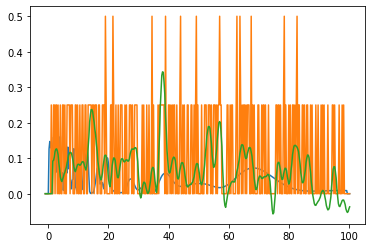

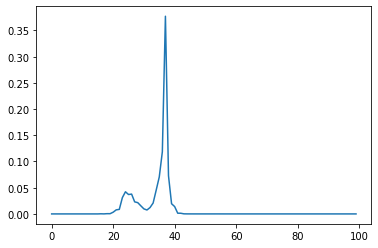

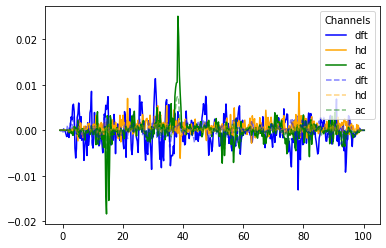



Counter({True: 9, False: 8})
Counter({True: 12, False: 5})
CoRoT ID: 102775698
Shap values (sorted): [[23 20 25 24 22 26 21 29 30 27 28 36 31 35 37 19 33 32 34 38 39 40 18 41
  42 45 43 44 46 17 47 48 16 49 50 51 13 52 15 55]]
Logg from Hareter: 3.75
Avg logg from NN: [3.82122274]
Confidence logg from NN: {&#39;logg_min&#39;: array([3.54972441]), &#39;logg_max&#39;: array([4.09272107])}
Logg from Hareter is inside NN confidence=: [ True]
[[34.4191037 ]
 [20.69915512]
 [47.27474727]]
{&#39;logg_min&#39;: array([3.78838719]), &#39;logg_max&#39;: array([4.32973791])}
{&#39;logg_min&#39;: array([3.4872903]), &#39;logg_max&#39;: array([4.03077634])}
{&#39;logg_min&#39;: array([3.97613599]), &#39;logg_max&#39;: array([4.51645893])}


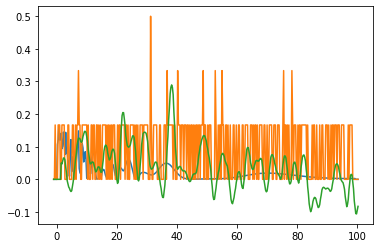

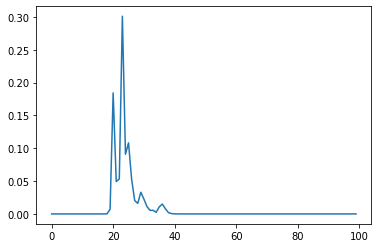

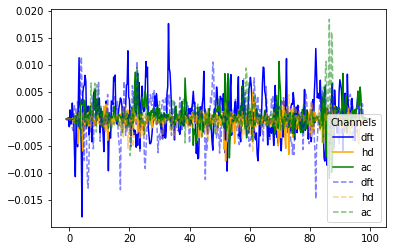



Counter({True: 9, False: 9})
Counter({True: 13, False: 5})
CoRoT ID: 102743992
Shap values (sorted): [[99 98 97 84 83 82 96 85 59 58 64 63 67 66 81 95 69 48 94 86 68 57 76 65
  75 62 61 87 93 70 77 47 49 45 60 78 74 79 80 56]]
Logg from Hareter: 4.3
Avg logg from NN: [4.68233306]
Confidence logg from NN: {&#39;logg_min&#39;: array([4.41286415]), &#39;logg_max&#39;: array([4.95180197])}
Logg from Hareter is inside NN confidence=: [False]
[[61.15404429]
 [96.01840098]
 [81.03437477]]
{&#39;logg_min&#39;: array([4.12832253]), &#39;logg_max&#39;: array([4.66799772])}
{&#39;logg_min&#39;: array([4.39481144]), &#39;logg_max&#39;: array([4.93377713])}
{&#39;logg_min&#39;: array([4.2946249]), &#39;logg_max&#39;: array([4.83379225])}


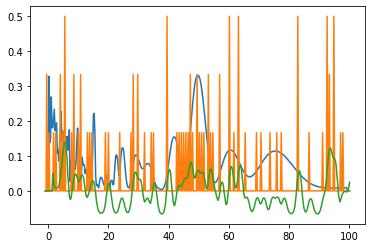

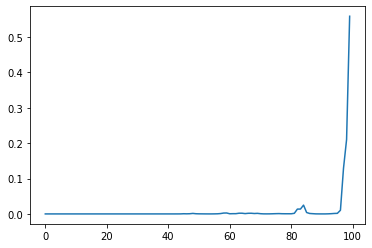

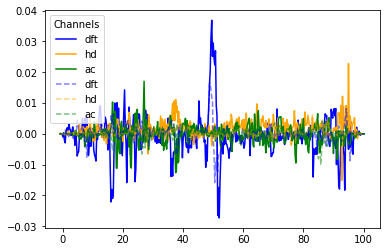



Counter({False: 10, True: 9})
Counter({True: 13, False: 6})
CoRoT ID: 102761878
Shap values (sorted): [[78 48 47 77 46 79 81 49 82 35 80 76 51 75 50 69 74 36 42 52 34 71 73 99
  53 41 70 38 54 44 43 55 45 68 40 39 67 37 72 84]]
Logg from Hareter: 3.7
Avg logg from NN: [4.54169502]
Confidence logg from NN: {&#39;logg_min&#39;: array([4.2720832]), &#39;logg_max&#39;: array([4.81130684])}
Logg from Hareter is inside NN confidence=: [False]
[[74.83256171]
 [44.50425384]
 [86.88704219]]
{&#39;logg_min&#39;: array([4.24759523]), &#39;logg_max&#39;: array([4.78688452])}
{&#39;logg_min&#39;: array([3.9404194]), &#39;logg_max&#39;: array([4.48091884])}
{&#39;logg_min&#39;: array([4.33580821]), &#39;logg_max&#39;: array([4.87488305])}


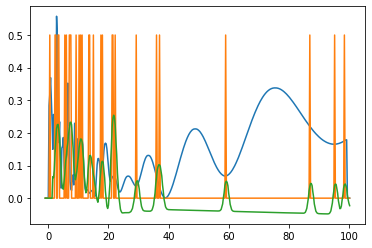

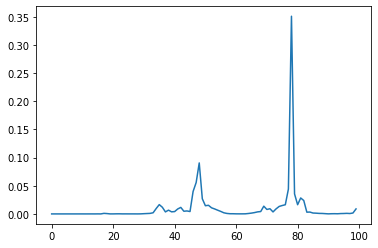

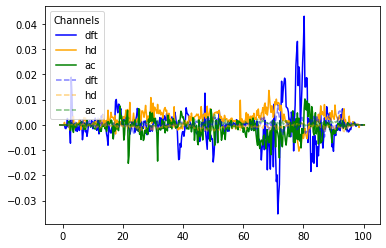



Counter({False: 11, True: 9})
Counter({True: 13, False: 7})
CoRoT ID: 102657423
Shap values (sorted): [[25 23 26 21 22 24 27 28 20 29 30 31 19 32 33 18 34 35 36 37 38 39 17 16
  40 41 13 42 43 44 45 46 47 48 49 52 50 51 15 53]]
Logg from Hareter: 3.425
Avg logg from NN: [3.87041922]
Confidence logg from NN: {&#39;logg_min&#39;: array([3.599106]), &#39;logg_max&#39;: array([4.14173245])}
Logg from Hareter is inside NN confidence=: [False]
[[20.69726803]
 [46.8258259 ]
 [34.04783503]]
{&#39;logg_min&#39;: array([3.48723629]), &#39;logg_max&#39;: array([4.03072276])}
{&#39;logg_min&#39;: array([3.97049337]), &#39;logg_max&#39;: array([4.51084359])}
{&#39;logg_min&#39;: array([3.78196894]), &#39;logg_max&#39;: array([4.32335908])}


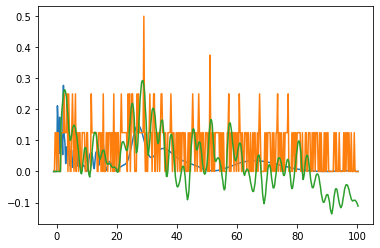

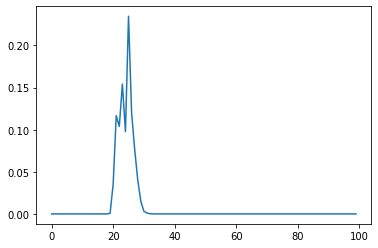

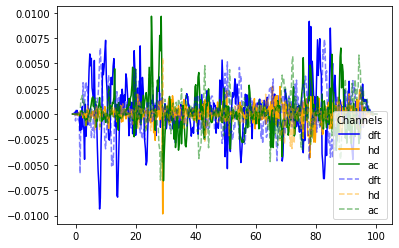



Counter({False: 12, True: 9})
Counter({True: 13, False: 8})
Counter({False: 12, True: 10})
Counter({True: 14, False: 8})
Counter({False: 12, True: 11})
Counter({True: 15, False: 8})
Counter({False: 13, True: 11})
Counter({True: 15, False: 9})
Counter({False: 14, True: 11})
Counter({True: 16, False: 9})
Counter({False: 15, True: 11})
Counter({True: 16, False: 10})
Counter({False: 15, True: 12})
Counter({True: 17, False: 10})
Counter({False: 15, True: 13})
Counter({True: 18, False: 10})
Counter({False: 16, True: 13})
Counter({True: 19, False: 10})
Counter({False: 17, True: 13})
Counter({True: 20, False: 10})
Counter({False: 17, True: 14})
Counter({True: 21, False: 10})
Counter({False: 18, True: 14})
Counter({True: 21, False: 11})
Counter({False: 18, True: 15})
Counter({True: 22, False: 11})
Counter({False: 18, True: 16})
Counter({True: 23, False: 11})
Counter({False: 18, True: 17})
Counter({True: 24, False: 11})
Counter({True: 18, False: 18})
Counter({True: 25, False: 11})
Counter({Tru

In [39]:
# Read datasets of preprocessed stars
df_cor = corot()
dfcor = df_cor.load("../../astronn/data/corot/preprocessed/*.log", batch_size=1)

count = 0
# DS to save logg_g compatibles
aux = []
aux_topk_comp = []
# Other variables to save third results
_x = []
_y = []
_y_topk = []
_l = [] #luminosity
_star_id = []
for star in dfcor.take(75):  # take the 75 corot stars
    # Star channels info
    x_star = star[1].numpy()
    # Star logg from data
    logg_data = star[2][0].numpy()
    l = star[3][0].numpy()
    _l.append(l)
    _star_id.append(star[0].numpy()[0].decode("utf-8"))

    # Dnu NN inference
    dnu_hat = sepconv_mod.predict_classes(star[1])

        
    # Calculate logg from Dnu infered by the NN
    rhos = getRhoFromDnu(dnu_hat, 4)
    radios = get_radio_from_rho(rhos["rho"], rhos["error"])
    loggs_condifence = get_logg_from_radio(radios["r_max"], radios["r_min"])
    # Get central point of logg confidence
    loggs_average = (loggs_condifence["logg_max"] + loggs_condifence["logg_min"]) / 2

    # Append data for posterior analysis
    _x.append(logg_data)
    _y.append(loggs_average[0])

    # Flag to point out if logg from data is inside the confidence interval
    flag = (
        logg_data <= loggs_condifence["logg_max"]
        and logg_data >= loggs_condifence["logg_min"]
    )
    aux.append(flag) # save

    # Flag to point if real value are into one component
    # Calculate gradient explainers and shap values
    e = shap.GradientExplainer(
        sepconv_mod, _train_shap, batch_size=10, local_smoothing=0
    )
    shap_values, indexes = e.shap_values(
        x_star, nsamples=100, ranked_outputs=40
    )

    gmm = GaussianMixture(n_components=3).fit(indexes[0].reshape(-1, 1))
    labels = gmm.predict(indexes[0].reshape(-1, 1))

    loggs_confidence_aux = get_logg_confidence(gmm.means_[0])
    flag1 = logg_data <= loggs_confidence_aux["logg_max"] and logg_data >= loggs_confidence_aux["logg_min"]
    if flag1:
        _y_topk.append((get_logg_confidence(gmm.means_[0])["logg_min"][0] + get_logg_confidence(gmm.means_[0])["logg_max"][0]) / 2)
    loggs_confidence_aux = get_logg_confidence(gmm.means_[1])
    flag2 = logg_data <= loggs_confidence_aux["logg_max"] and logg_data >= loggs_confidence_aux["logg_min"]
    if flag2 and not flag1:
        _y_topk.append((get_logg_confidence(gmm.means_[1])["logg_min"][0] + get_logg_confidence(gmm.means_[1])["logg_max"][0]) / 2)
    loggs_confidence_aux = get_logg_confidence(gmm.means_[2])
    flag3 = logg_data <= loggs_confidence_aux["logg_max"] and logg_data >= loggs_confidence_aux["logg_min"]
    if flag3 and not flag1 and not flag2:
        _y_topk.append((get_logg_confidence(gmm.means_[2])["logg_min"][0] + get_logg_confidence(gmm.means_[2])["logg_max"][0]) / 2)
    # Else
    if not flag3 and not flag1 and not flag2:
        _y_topk.append(loggs_average[0])

    aux_topk_comp.append(flag1 or flag2 or flag3)

    print(Counter([e[0] for e in aux]))
    print(Counter([e[0] for e in aux_topk_comp]))

    # Plot graphs and info (debug)
    if True and count < 20:
        # Calculate gradient explainers and shap values
        e = shap.GradientExplainer(
            sepconv_mod, _train_shap, batch_size=10, local_smoothing=0
        )
        shap_values, indexes = e.shap_values(
            star[1].numpy(), nsamples=100, ranked_outputs=40
        )

        # Log info
        print("CoRoT ID:",star[0].numpy()[0].decode("utf-8"))
        print("Shap values (sorted):",indexes)
        print("Logg from Hareter:",logg_data)
        print("Avg logg from NN:",loggs_average)
        print("Confidence logg from NN:",loggs_condifence)
        print("Logg from Hareter is inside NN confidence=:",flag)

        gmm = GaussianMixture(n_components=3).fit(indexes[0].reshape(-1, 1))
        labels = gmm.predict(indexes[0].reshape(-1, 1))
        print(gmm.means_)
        def get_logg_confidence(dnu_hat):
            """
            """
            rhos = getRhoFromDnu(dnu_hat, 4)
            radios = get_radio_from_rho(rhos["rho"], rhos["error"])
            loggs_condifence = get_logg_from_radio(radios["r_max"], radios["r_min"])
            # Get central point of logg confidence
            loggs_average = (loggs_condifence["logg_max"] + loggs_condifence["logg_min"]) / 2
            return loggs_condifence
        print(get_logg_confidence(gmm.means_[0]))
        print(get_logg_confidence(gmm.means_[1]))
        print(get_logg_confidence(gmm.means_[2]))

        # Plot star
        x = np.arange(-1, 100.5, 0.25)  # x axis from 0 to 100
        plt.plot(x, x_star[0, :, 0])
        plt.plot(x, x_star[0, :, 1])
        plt.plot(x, x_star[0, :, 2])
        plt.show()
        plt.plot(sepconv_mod.predict_proba(x_star)[0][0:100])
        plt.show()

        # Plot shap
        
        plt.plot(x, shap_values[0][0][:, [0]], label="dft", linestyle="solid", color="blue")
        plt.plot(
            x, shap_values[0][0][:, [1]], label="hd", linestyle="solid", color="orange"
        )
        plt.plot(x, shap_values[0][0][:, [2]], label="ac", linestyle="solid", color="green")
        plt.plot(
            x,
            shap_values[1][0][:, [0]],
            label="dft",
            linestyle="--",
            color="blue",
            alpha=0.5,
        )
        plt.plot(
            x,
            shap_values[1][0][:, [1]],
            label="hd",
            linestyle="--",
            color="orange",
            alpha=0.5,
        )
        plt.plot(
            x,
            shap_values[1][0][:, [2]],
            label="ac",
            linestyle="--",
            color="green",
            alpha=0.5,
        )

        plt.legend(title="Channels")
        plt.show()
        print("\n")

    count += 1
# Compatible cases numbers
print(Counter([e[0] for e in aux]))
print(Counter([e[0] for e in aux_topk_comp]))

In [40]:
print(Counter([e[0] for e in aux]))
print(Counter([e[0] for e in aux_topk_comp]))

Counter({False: 40, True: 35})
Counter({True: 49, False: 26})


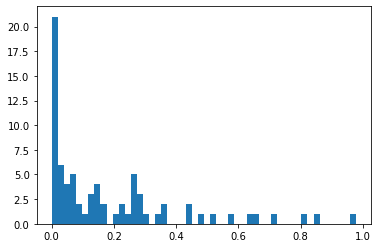

In [41]:
_ = plt.hist(np.power(np.asarray(_y)-np.asarray(_x), 2), bins=50)

(array([ 1.,  1.,  1.,  0.,  0.,  0.,  0.,  5.,  6., 11.,  7., 10.,  6.,
         3.,  8.,  3.,  1.,  3.,  2.,  0.,  0.,  1.,  1.,  0.,  0.,  2.,
         1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([ 6000.,  6136.,  6272.,  6408.,  6544.,  6680.,  6816.,  6952.,
         7088.,  7224.,  7360.,  7496.,  7632.,  7768.,  7904.,  8040.,
         8176.,  8312.,  8448.,  8584.,  8720.,  8856.,  8992.,  9128.,
         9264.,  9400.,  9536.,  9672.,  9808.,  9944., 10080., 10216.,
        10352., 10488., 10624., 10760., 10896., 11032., 11168., 11304.,
        11440., 11576., 11712., 11848., 11984., 12120., 12256., 12392.,
        12528., 12664., 12800.], dtype=float32),
 &lt;a list of 50 Patch objects&gt;)

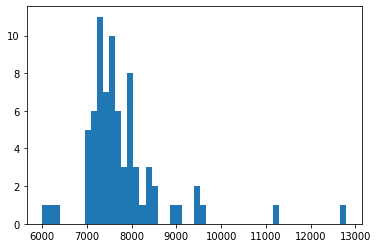

In [42]:
plt.hist(_l, bins=50) # plot Luminosity

## Error analysis

### Top-1. Most probable value

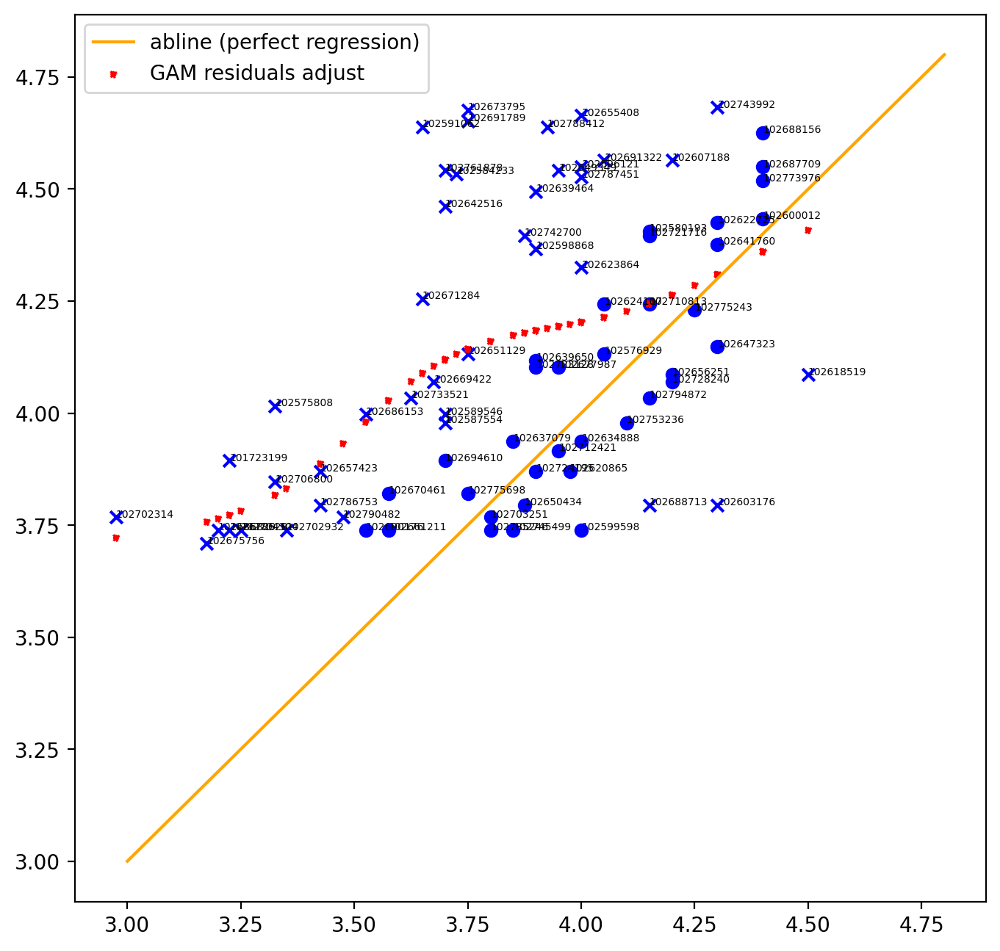

In [48]:
gam = LinearGAM(n_splines=10)
gam.fit(_x, _y)

# Scatter all "residuals"
fig = plt.subplots(1, figsize=(8, 8), dpi=200)
for i in range(len(_x)):
    if aux[i]:
        mark = "o"  # compatible
    else:
        mark = "x"  # no-compatible
    plt.scatter(_x[i], _y[i], marker=mark, color="blue")
# Plot model
plt.scatter(
    _x,
    gam.predict(_x),
    c="red",
    marker=".",
    linestyle=":",
    label="GAM residuals adjust",
)
for i, txt in enumerate(_star_id):
    plt.annotate(txt, (_x[i], _y[i]), size=5)

# Add abline(0,1)
x = np.linspace(3.0, 4.8, 10)
plt.plot(x, x + 0, linestyle="solid", c="orange", label="abline (perfect regression)")
plt.legend(title="")
plt.show()

### Top-K. Most probable value

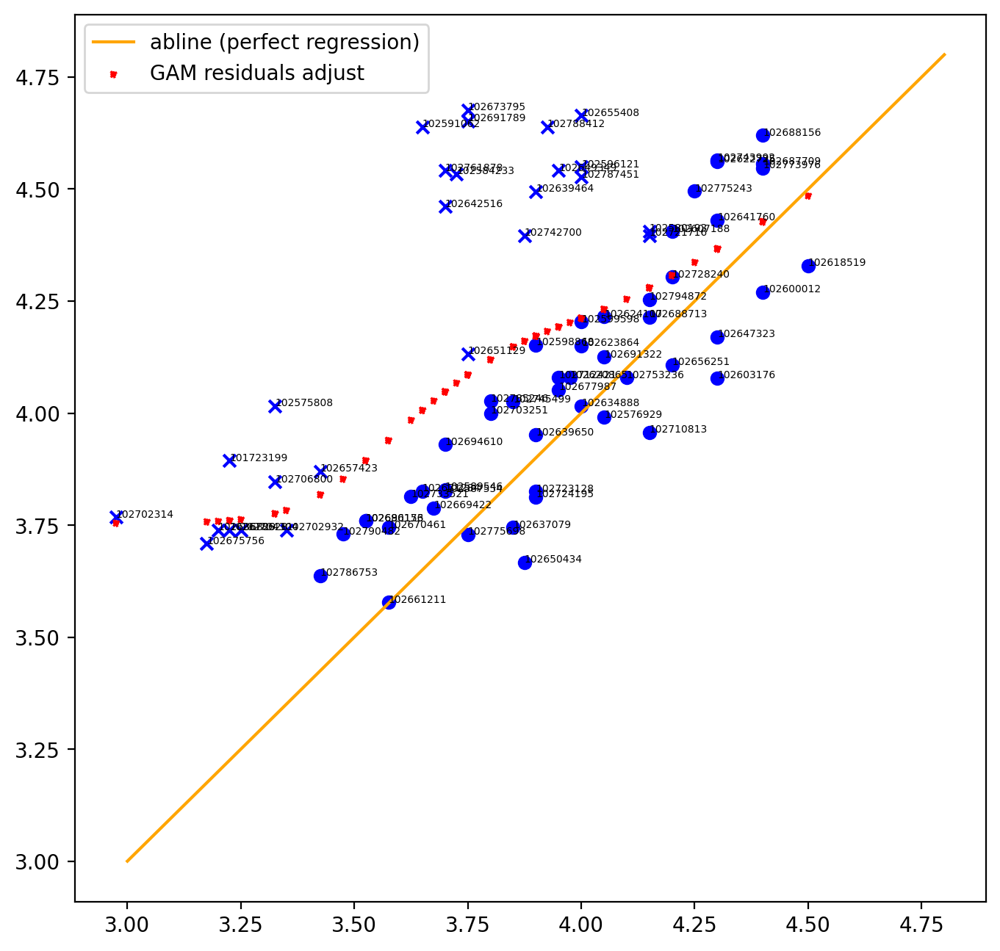

In [47]:
gam = LinearGAM(n_splines=10)
gam.fit(_x, _y_topk)

# Scatter all "residuals"
fig = plt.subplots(1, figsize=(8, 8), dpi=200)
for i in range(len(_x)):
    if aux_topk_comp[i]:
        mark = "o"  # compatible
    else:
        mark = "x"  # no-compatible
    plt.scatter(_x[i], _y_topk[i], marker=mark, color="blue")
# Plot model
plt.scatter(
    _x,
    gam.predict(_x),
    c="red",
    marker=".",
    linestyle=":",
    label="GAM residuals adjust",
)
for i, txt in enumerate(_star_id):
    plt.annotate(txt, (_x[i], _y_topk[i]), size=5)

# Add abline(0,1)
x = np.linspace(3.0, 4.8, 10)
plt.plot(x, x + 0, linestyle="solid", c="orange", label="abline (perfect regression)")
plt.legend(title="")
plt.show()

In [49]:
gam = LinearGAM(n_splines=10)
gam.fit(_x, _y_topk)
gam.summary()

gam = LinearGAM(n_splines=10)
gam.fit(_x, _y)
gam.summary()

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                      5.1114
Link Function:                     IdentityLink Log Likelihood:                                  -378.8947
Number of Samples:                           75 AIC:                                              770.0122
                                                AICc:                                             771.2926
                                                GCV:                                                0.0778
                                                Scale:                                              0.0684
                                                Pseudo R-Squared:                                   0.3822
Feature Function                  Lam